In [1]:
import sys
import matplotlib.pyplot as plt
from collections import defaultdict

import pandas as pd

sys.path.append('../bin')
from bin.functions import *
np.seterr(divide = 'ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [2]:
def remove_consecutive_duplicates(arr):
    """
    Remove consecutive duplicate values from an array.

    Parameters:
        arr (numpy.ndarray): Input array.

    Returns:
        pd.Series: Array without consecutive duplicate values.
    """

    indices = np.nonzero(np.diff(arr) != 0)[0] + 1
    unique_values = np.concatenate(([arr[0]], arr[indices]))
    return pd.Series(unique_values)

def permutation_series(ts: pd.Series, window: int) -> list:
    r = list(range(window))
    permutation_list = list(it.permutations(r))
    pseries = []
    real_ts = remove_consecutive_duplicates(ts.copy().to_numpy())
    for i in range(real_ts.size - window + 1):
        slice_df = real_ts.copy().iloc[i:i + window]
        sort_slice = slice_df.copy().sort_values()
        for j in range(window):
            slice_df[slice_df[slice_df == sort_slice.iloc[j]].first_valid_index()] = j
        pseries.append(permutation_list.index(tuple(slice_df.tolist())))
    return pseries

def compute_transition_matrix(sequence, states):
    # Создаем словарь для хранения количества переходов между состояниями
    transitions = defaultdict(lambda: defaultdict(int))
    
    # Считаем количество переходов между состояниями
    for i in range(len(sequence) - 1):
        current_state = sequence[i]
        next_state = sequence[i + 1]
        transitions[current_state][next_state] += 1
    
    # Создаем пустую матрицу переходных вероятностей
    transition_matrix = np.zeros((len(states), len(states)))
    
    # Вычисляем вероятности переходов и заполняем матрицу
    for i, state in enumerate(states):
        total_transitions = sum(transitions[state].values())
        #Заполню одинаковыми значениями
        if total_transitions == 0:
            transition_matrix[i] = [1/len(states)]*len(states)
        else:
            for j, next_state in enumerate(states):
                transition_count = transitions[state][next_state]
                
                transition_matrix[i][j] = transition_count / total_transitions
    
    return transition_matrix

In [3]:
def entropy_rate(transition_matrix):
    """
    Compute the entropy rate of a Markov chain.

    Parameters:
        transition_matrix (numpy.ndarray): Transition matrix of the Markov chain.

    Returns:
        float: Entropy rate of the Markov chain.
    """
    transition_probabilities = np.array(transition_matrix, dtype=float)

    # Compute stationary distribution
    #TODO разобраться с нормальным вычислением. С помощью собственного вектора возникает проблема, когда 1 - собственное число кратности больше одного. С помощью решения системы уравнения stat_dist * P = stat_dist возникает проблема детерминантна, равного нулю. Пока что вычисляем приближенно за 50 шагов.
    # eigenvalues, eigenvectors = np.linalg.eig(transition_probabilities.T)
    # stationary_vector = np.real(eigenvectors[:, np.isclose(eigenvalues, 1)])
    
    # n = len(transition_probabilities)
    # A = np.append(transpose(transition_probabilities)-identity(n), [[1 for _ in range(n)]], axis=0)
    # b = transpose(np.array([0 for _ in range(n)]+[1]))
    # stationary_distribution = np.linalg.solve(transpose(A).dot(A), transpose(A).dot(b))
    
    matrix_dot = transition_probabilities.copy()
    for _ in range(50):
        matrix_dot = np.dot(matrix_dot, transition_probabilities)
    stationary_distribution = np.mean(matrix_dot, axis=0)
    
    # Normalize the stationary distribution
    stationary_distribution /= stationary_distribution.sum()

    # Compute entropy rate of vectors stationary_distribution
    ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.log2(stationary_distribution)))
    
    # Compute entropy rate of transition matrix
    tr_ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.sum(np.nan_to_num(transition_probabilities * np.log2(transition_probabilities)), axis=0)))

    return ent_rate, tr_ent_rate

# Example usage:
transition_matrix = [[0.8, 0.2],
                    [0.3, 0.7]]
entropy = entropy_rate(transition_matrix)
print("Entropy rate:", entropy)


Entropy rate: (0.9709505944546687, 0.7970140284791722)


In [94]:
ts = generate_ts()
p_ts = permutation_series(ts, 3)
tm = compute_transition_matrix(p_ts, [0,1,2,3,4,5])

In [95]:
print(entropy_rate(tm))

(1.57860928744898, 0.74681922255095)


C:\Users\vitya\AppData\Local\Temp\ipykernel_9584\1138509376.py:26: RuntimeWarning: invalid value encountered in multiply
  tr_ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.sum(np.nan_to_num(transition_probabilities * np.log2(transition_probabilities)), axis=0)))


In [96]:
ts1 = random_walk()
p_ts1 = permutation_series(ts1, 3)
tm1 = compute_transition_matrix(p_ts1, [0,1,2,3,4,5])
print(entropy_rate(tm1))

(2.4671306576180765, 1.4400979180131142)


C:\Users\vitya\AppData\Local\Temp\ipykernel_9584\1138509376.py:26: RuntimeWarning: invalid value encountered in multiply
  tr_ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.sum(np.nan_to_num(transition_probabilities * np.log2(transition_probabilities)), axis=0)))


In [97]:
matrixx = tm1
for i in range(50):
    matrixx = np.dot(matrixx, tm1)
    print(entropy_rate(matrixx))

(2.467130657618076, 2.631283534463507)
(2.4671306576180765, 2.637336903470037)
(2.4671306576180765, 2.6378888853872144)
(2.4671306576180765, 2.637909710557204)
(2.4671306576180765, 2.6379103116374427)
(2.4671306576180765, 2.637910141518085)
(2.4671306576180765, 2.637910121631494)
(2.4671306576180765, 2.6379101242700185)
(2.4671306576180765, 2.63791012526682)
(2.4671306576180765, 2.6379101252278945)
(2.4671306576180765, 2.637910125198208)
(2.4671306576180765, 2.6379101251962624)
(2.4671306576180765, 2.637910125197117)
(2.4671306576180765, 2.6379101251972266)
(2.467130657618077, 2.637910125197212)
(2.4671306576180765, 2.637910125197206)
(2.4671306576180765, 2.6379101251972066)
(2.4671306576180765, 2.637910125197207)
(2.4671306576180765, 2.6379101251972066)
(2.4671306576180765, 2.6379101251972066)
(2.4671306576180765, 2.6379101251972066)
(2.4671306576180765, 2.637910125197207)
(2.467130657618077, 2.637910125197207)
(2.4671306576180765, 2.637910125197207)
(2.467130657618077, 2.637910125197

In [98]:
matrixx = tm
for i in range(50):
    matrixx = np.dot(matrixx, tm)
    print(entropy_rate(matrixx))

(1.5786092874489797, 2.274132260056248)
(1.5786092874489799, 2.607294274541249)
(1.5786092874489797, 2.5288534882489935)
(1.5786092874489803, 2.5504231787700937)
(1.57860928744898, 2.545256990672836)
(1.5786092874489794, 2.5465810767188874)
(1.5786092874489799, 2.546262683371516)
(1.5786092874489797, 2.546342680245826)
(1.5786092874489803, 2.546322828881991)
(1.5786092874489803, 2.546327759993482)
(1.57860928744898, 2.5463265292244195)
(1.57860928744898, 2.5463268352757473)
(1.5786092874489803, 2.5463267590465217)
(1.57860928744898, 2.5463267780279333)
(1.5786092874489805, 2.546326773303181)
(1.5786092874489805, 2.54632677447965)
(1.57860928744898, 2.546326774186764)
(1.5786092874489808, 2.5463267742596827)
(1.5786092874489797, 2.546326774241528)
(1.578609287448981, 2.5463267742460474)
(1.578609287448981, 2.546326774244922)
(1.5786092874489805, 2.5463267742452014)
(1.5786092874489803, 2.5463267742451317)
(1.57860928744898, 2.54632677424515)
(1.5786092874489794, 2.5463267742451463)
(1.5

C:\Users\vitya\AppData\Local\Temp\ipykernel_9584\1138509376.py:26: RuntimeWarning: invalid value encountered in multiply
  tr_ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.sum(np.nan_to_num(transition_probabilities * np.log2(transition_probabilities)), axis=0)))


In [99]:
ts = generate_ts()
p_ts = permutation_series(ts, 4)
tm = compute_transition_matrix(p_ts, [i for i in range(24)])

In [100]:
tm

array([[0.73795181, 0.26204819, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.81308411, 0.        , 0.1588785 ,
        0.02803738, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.71666667, 0.26666667, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.00833333, 0.        ,
        0.00833333, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.   

In [101]:
matrixx = tm
for i in range(50):
    matrixx = np.dot(matrixx, tm)
    print(entropy_rate(matrixx))

(2.4072873277470683, 5.406588849287086)
(2.4072873277470817, 8.573232743747091)
(2.407287327747069, 9.641616358809737)
(2.407287327747083, 10.005105301584363)
(2.4072873277470688, 10.116446511555317)
(2.4072873277470754, 10.125886427394384)
(2.407287327747076, 10.129563077769289)
(2.407287327747072, 10.126472313875063)
(2.407287327747069, 10.12667748551393)
(2.4072873277470688, 10.126207916533682)
(2.407287327747083, 10.126543639663327)
(2.4072873277470683, 10.126496858254754)
(2.40728732774708, 10.126560754139641)
(2.4072873277470705, 10.126533145337556)
(2.407287327747075, 10.126544270382624)
(2.407287327747092, 10.126537274426806)
(2.4072873277470785, 10.126540411512394)
(2.4072873277470705, 10.126538939631603)
(2.4072873277470803, 10.12653975894028)
(2.407287327747072, 10.126539385678583)
(2.4072873277470785, 10.126539572972709)
(2.4072873277470714, 10.12653947765321)
(2.407287327747071, 10.126539523359225)
(2.407287327747084, 10.126539500468516)
(2.4072873277470754, 10.12653951186

C:\Users\vitya\AppData\Local\Temp\ipykernel_9584\1138509376.py:23: RuntimeWarning: invalid value encountered in log2
  ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.log2(stationary_distribution)))
C:\Users\vitya\AppData\Local\Temp\ipykernel_9584\1138509376.py:26: RuntimeWarning: invalid value encountered in multiply
  tr_ent_rate = -np.sum(np.nan_to_num(stationary_distribution * np.sum(np.nan_to_num(transition_probabilities * np.log2(transition_probabilities)), axis=0)))


In [38]:
input_file = ("../src/M4-methods/Dataset/Train/Quarterly-train.csv")
with open(input_file, 'r') as file:
    # Убираем кавычки из каждой строки
    lines = [line.replace('"', '') for line in file]

st = "".join(lines)
output_file = "output.csv"
f = open(output_file, "w")
f.write(st)
f.close()
df_q = pd.read_csv(output_file, index_col=0)

In [39]:
print(df_q.shape)
df_q.head()

(24000, 866)


,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,...,V858,V859,V860,V861,V862,V863,V864,V865,V866,V867
V1,,,,,,,,,,,,,,,,,,,,,
Q1,7407.412314,7528.566074,7374.709225,7395.514848,7654.007989,7686.847835,7578.190743,7904.376716,7744.049254,7889.909013,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q2,7552.454619,7541.774571,7466.568336,7550.333354,8067.131522,8063.701017,7901.029312,8155.387316,8031.010328,8023.240005,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q3,8463.842193,8366.102309,8269.502192,8256.985325,8726.917647,8733.243591,8664.260087,8717.394568,8662.139727,8629.101896,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q4,8498.941194,8409.926442,8391.441381,8292.860310,8798.521118,8753.990355,8740.062556,8695.540651,8627.447488,8525.993424,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q5,1835.000000,2322.000000,3059.000000,1883.000000,1896.000000,2060.000000,2764.000000,1743.000000,1561.000000,1934.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
col1 = [f"frob_norm{i+1}" for i in range(5)]
col2 = [f"nuclear_norm{i+1}" for i in range(5)]
col3 = [f"stat_entropy{i+1}" for i in range(5)]
col4 = [f"tran_entropy{i+1}" for i in range(5)]
col = col1 + col2 + col3 + col4
df_norm3 = pd.DataFrame(columns=col)
df_norm4 = pd.DataFrame(columns=col)
df_norm5 = pd.DataFrame(columns=col)

In [133]:
np.seterr(all = 'ignore')
for index, row in df_q.iterrows():
    if int(index[1:])%10 == 0:
        print(int(index[1:]))
    ts = row.dropna()
    p_ts3 = permutation_series(ts, 3)
    transition_matrix = compute_transition_matrix(p_ts3, [0,1,2,3,4,5])
    frob_norm = [np.linalg.norm(transition_matrix)]
    nuc_norm =[np.linalg.norm(transition_matrix, ord='nuc')]
    ent1, ent2 = entropy_rate(transition_matrix)
    stat_entropy = [ent1]
    tran_entropy = [ent2]
    matrixx = transition_matrix
    for i in range(4):
        matrixx = np.dot(matrixx, transition_matrix)
        frob_norm.append(np.linalg.norm(matrixx))
        nuc_norm.append(np.linalg.norm(matrixx, ord='nuc'))
        ent1, ent2 = entropy_rate(matrixx)
        stat_entropy.append(ent1)
        tran_entropy.append(ent2)

    df_norm3.loc[index] = frob_norm + nuc_norm + stat_entropy + tran_entropy
    
    p_ts4 = permutation_series(ts, 4)
    transition_matrix = compute_transition_matrix(p_ts4, [i for i in range(24)])
    frob_norm = [np.linalg.norm(transition_matrix)]
    nuc_norm =[np.linalg.norm(transition_matrix, ord='nuc')]
    ent1, ent2 = entropy_rate(transition_matrix)
    stat_entropy = [ent1]
    tran_entropy = [ent2]
    matrixx = transition_matrix
    for i in range(4):
        matrixx = np.dot(matrixx, transition_matrix)
        frob_norm.append(np.linalg.norm(matrixx))
        nuc_norm.append(np.linalg.norm(matrixx, ord='nuc'))
        ent1, ent2 = entropy_rate(matrixx)
        stat_entropy.append(ent1)
        tran_entropy.append(ent2)

    df_norm4.loc[index] = frob_norm + nuc_norm + stat_entropy + tran_entropy
    
    p_ts5 = permutation_series(ts, 5)
    transition_matrix = compute_transition_matrix(p_ts5, [i for i in range(120)])
    frob_norm = [np.linalg.norm(transition_matrix)]
    nuc_norm =[np.linalg.norm(transition_matrix, ord='nuc')]
    ent1, ent2 = entropy_rate(transition_matrix)
    stat_entropy = [ent1]
    tran_entropy = [ent2]
    matrixx = transition_matrix
    for i in range(4):
        matrixx = np.dot(matrixx, transition_matrix)
        frob_norm.append(np.linalg.norm(matrixx))
        nuc_norm.append(np.linalg.norm(matrixx, ord='nuc'))
        ent1, ent2 = entropy_rate(matrixx)
        stat_entropy.append(ent1)
        tran_entropy.append(ent2)

    df_norm5.loc[index] = frob_norm + nuc_norm + stat_entropy + tran_entropy

10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
1500
1510
1520
1530
1540
1550
1560
1570
1580
1590
1600
1610
1620
1630
1640
1650
1660
1670
1680
1690
1700
1710
1720
1730
1740
1750
1760
1770
1780
1790
1800
1810
1820
1830
1840
1850
1860
1870
1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000
2010
2020
2030
2040
2050
2060
2070
2080
2090
2100
2110
2120
2130
2140
2150
2160
2170
2180
2190
2200
2210
222

In [134]:
df_res = pd.read_csv("all_results.csv", index_col=0)
result3 = pd.merge(df_res, df_norm3, left_index=True, right_index=True)
result4 = pd.merge(df_res, df_norm4, left_index=True, right_index=True)
result5 = pd.merge(df_res, df_norm5, left_index=True, right_index=True)

In [4]:
def mean_plot(result, metrics1, metrics2):
    b = np.linspace(result[metrics2].min(), result[metrics2].max(), 50)
    metrics2_mean = []
    metrics1_mean = []
    for i in range(1,50):
        metrics2_mean.append((b[i - 1]+b[i])/2)
        a = result[(b[i - 1] <= result[metrics2]) & (result[metrics2] < b[i])]
        metrics1_mean.append(a[metrics1].median())
    return (metrics1_mean, metrics2_mean)
def plot_norm(result, metrics, norma):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 30))
    for i in range(5):
            ind, mtr = mean_plot(result, metrics, f"{norma}_norm{i+1}")
            axes[i//2, i%2].scatter(result[metrics], result[f"{norma}_norm{i+1}"], color='blue', alpha=0.1)
            axes[i//2, i%2].scatter(ind, mtr, color='red')
            axes[i//2, i%2].set_title('Матрица')
            axes[i//2, i%2].set_xlabel(metrics)
            axes[i//2, i%2].set_ylabel(f"{norma}_norm{i+1}")
            axes[i//2, i%2].semilogx()
            axes[i//2, i%2].grid(True)
    plt.tight_layout()
    plt.show()
def plot_entropy(result, metrics, entropy):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 30))
    for i in range(5):
            ind, mtr = mean_plot(result, metrics, f"{entropy}_entropy{i+1}")
            axes[i//2, i%2].scatter(result[metrics], result[f"{entropy}_entropy{i+1}"], color='blue', alpha=0.1)
            axes[i//2, i%2].scatter(ind, mtr, color='red')
            axes[i//2, i%2].set_title('Матрица')
            axes[i//2, i%2].set_xlabel(metrics)
            axes[i//2, i%2].set_ylabel(f"{entropy}_entropy{i+1}")
            axes[i//2, i%2].semilogx()
            axes[i//2, i%2].grid(True)
    plt.tight_layout()
    plt.show()   

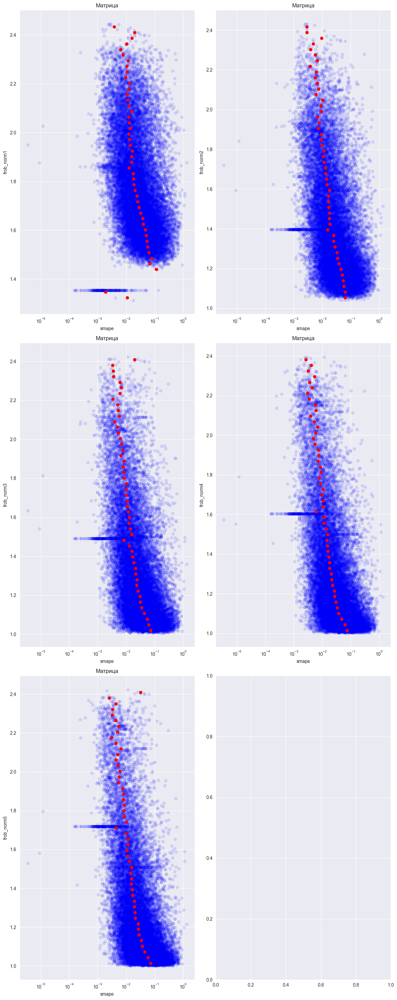

In [136]:
plot_norm(result3, 'smape', 'frob')

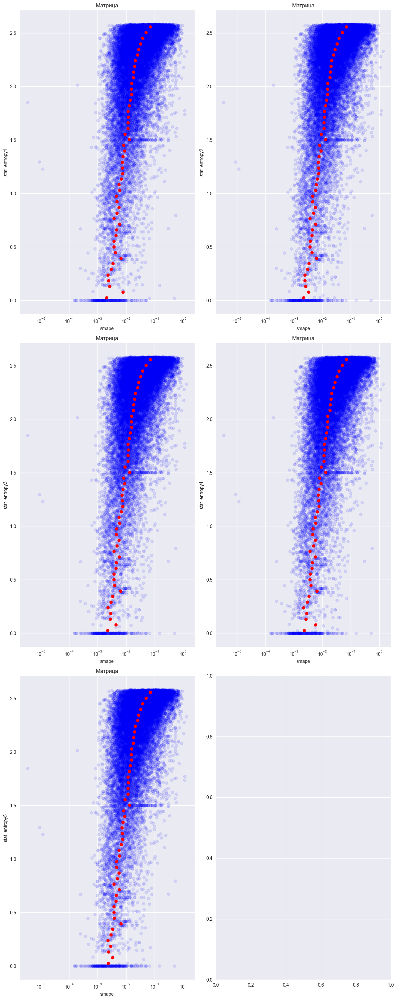

In [137]:
plot_entropy(result3, 'smape', 'stat')

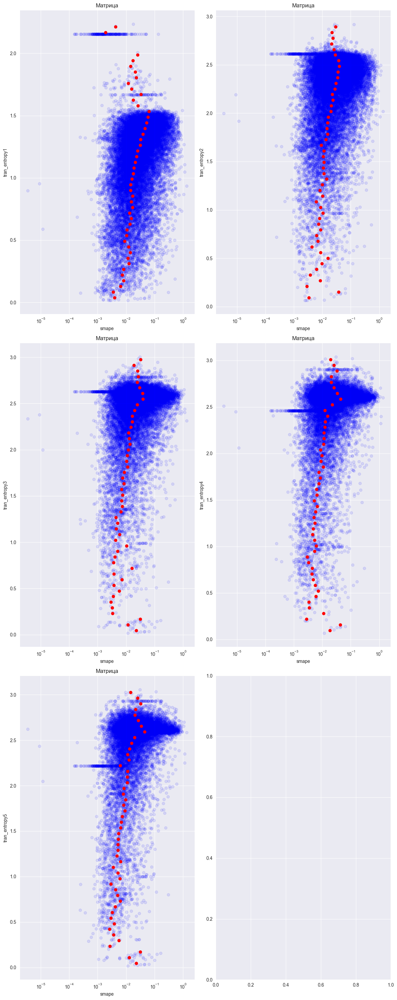

In [138]:
plot_entropy(result3, 'smape', 'tran')

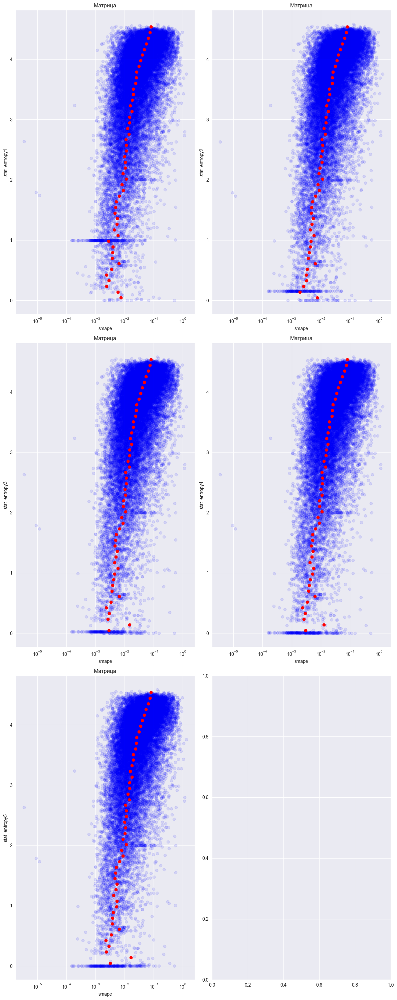

In [139]:
plot_entropy(result4, 'smape', 'stat')

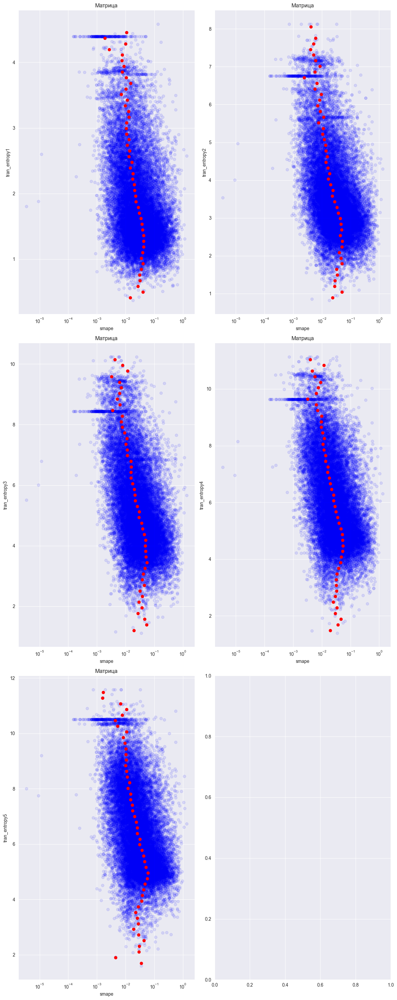

In [140]:
plot_entropy(result4, 'smape', 'tran')

In [141]:
def plot_2(result, norma, entropy, metric):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 30))
    for i in range(5):
            axes[i//2, i%2].scatter(result[f"{norma}_norm{i+1}"], result[f"{entropy}_entropy{i+1}"], c=result[metric], alpha=1)
            axes[i//2, i%2].set_title('Матрица')
            axes[i//2, i%2].set_xlabel(f"{norma}_norm{i+1}")
            axes[i//2, i%2].set_ylabel(f"{entropy}_entropy{i+1}")
            axes[i//2, i%2].grid(True)
    plt.tight_layout()
    plt.show()

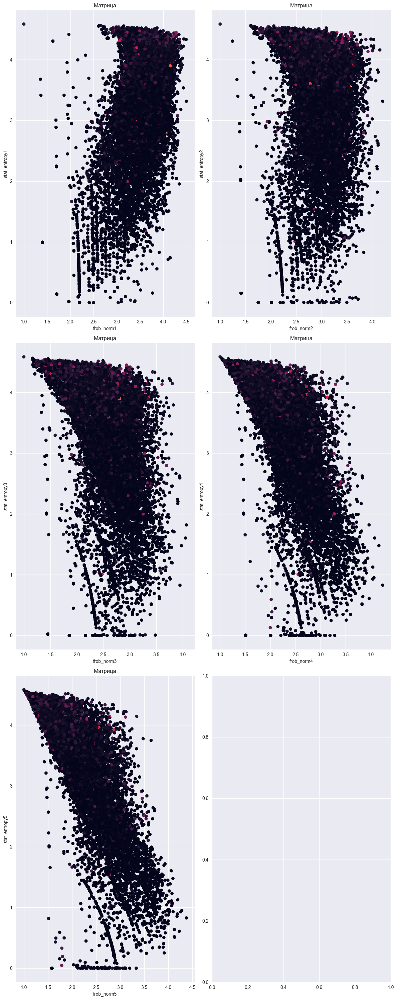

In [142]:
plot_2(result4, 'frob', 'stat', 'smape')

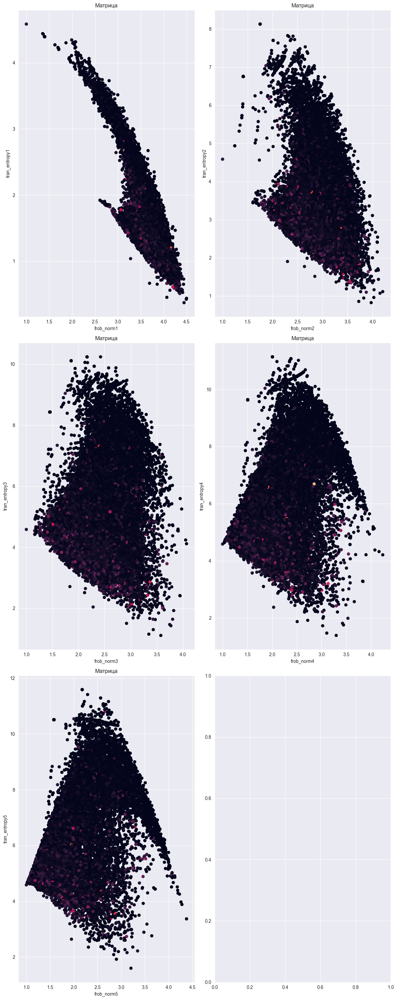

In [143]:
plot_2(result4, 'frob', 'tran', 'smape')

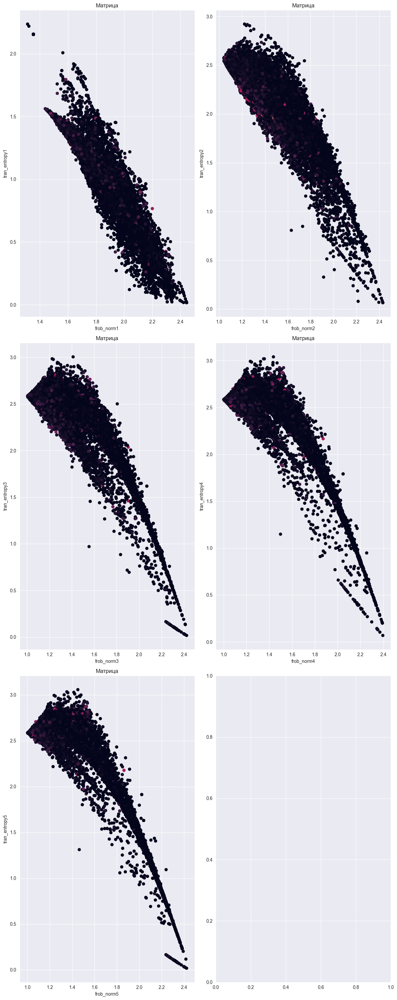

In [144]:
plot_2(result3, 'frob', 'tran', 'smape')

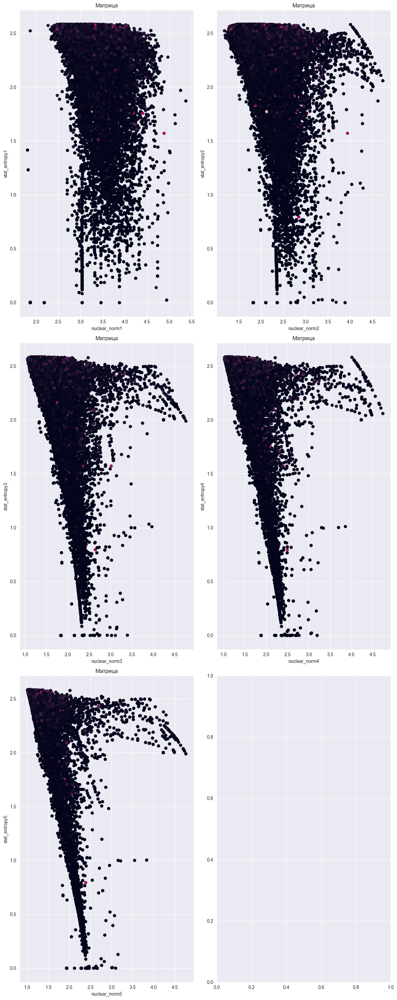

In [145]:
plot_2(result3, 'nuclear', 'stat', 'smape')

In [146]:
result3.to_csv('../src/feature/quater_ent_norm3.csv')
result4.to_csv('../src/feature/quater_ent_norm4.csv')
result5.to_csv('../src/feature/quater_ent_norm5.csv')

In [7]:
result4 = pd.read_csv('../src/feature/quater_ent_norm4.csv', index_col=0)

In [8]:
result4.head()

,perm_ent3,perm_ent4,mse,mape,sym_test,w_perm_ent4,smape,mase,max_diff,amplitude,...,stat_entropy1,stat_entropy2,stat_entropy3,stat_entropy4,stat_entropy5,tran_entropy1,tran_entropy2,tran_entropy3,tran_entropy4,tran_entropy5
Q1,NaN,0.818860,22333.057123,0.017638,True,0.470761,0.017467,0.386888,398.315999,1344.145321,...,3.690371,3.690414,3.690413,3.690413,3.690413,1.966157,2.784570,3.548322,4.123239,4.586118
Q2,NaN,0.779205,24564.254223,0.018605,True,0.496908,0.018422,0.363980,516.798168,1422.576544,...,3.446439,3.446439,3.446439,3.446439,3.446439,2.697682,4.424622,5.569147,6.507722,7.060409
Q3,NaN,0.698904,7767.906622,0.008752,True,0.474837,0.008720,0.172401,469.932322,1561.741992,...,3.184375,3.184375,3.184375,3.184375,3.184375,2.651720,4.745983,6.124130,6.969372,7.509469
Q4,NaN,0.738144,15323.172700,0.010606,True,0.489102,0.010475,0.251886,505.660807,1355.150018,...,0.555699,0.055318,0.004963,0.000421,0.000034,1.930209,3.337207,4.712708,6.319447,8.003970
Q5,NaN,0.612547,16146.143062,0.084324,True,0.471352,0.088779,0.702161,737.000000,2386.000000,...,2.798176,2.798971,2.813308,2.812514,2.798176,2.942084,4.328168,5.195484,5.766628,6.111984


TypeError: 'Axes' object is not subscriptable

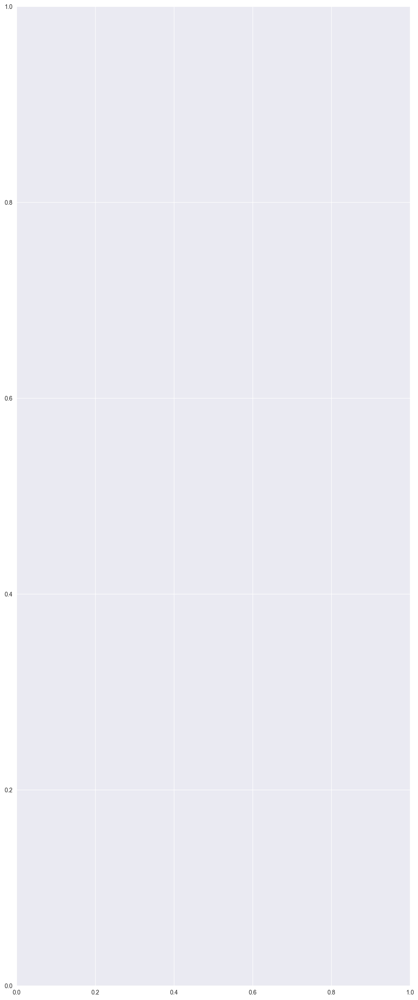

In [10]:
fig, axes = plt.subplots(figsize=(12, 30))
axes[0].scatter(result4[f"'stat_entropy1'"], result4[f"'perm_ent4'"], c=result4['smape'], alpha=1)
axes[0].set_title('Матрица')
axes[0].set_xlabel(f"stat_entropy")
axes.set_ylabel(f"perm_ent4")
axes.grid(True)
plt.tight_layout()
plt.show()

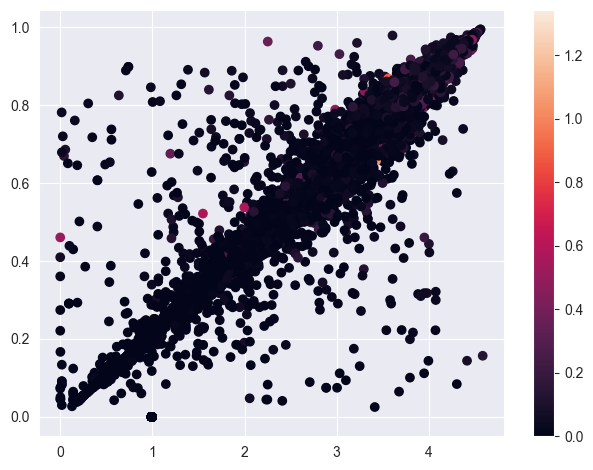

In [16]:
plt.scatter(result4["stat_entropy1"], result4["perm_ent4"], c=result4['smape'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

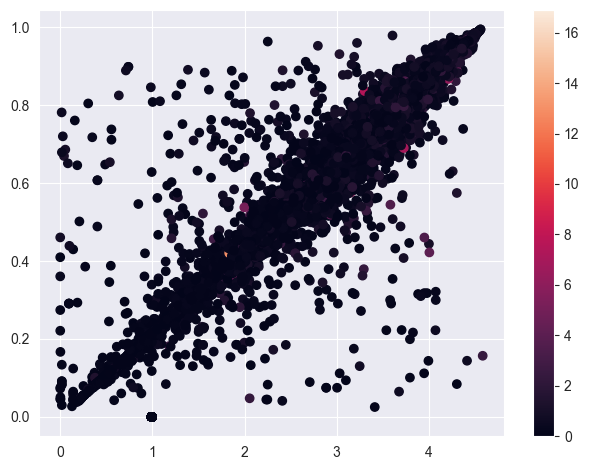

In [17]:
plt.scatter(result4["stat_entropy1"], result4["perm_ent4"], c=result4['mase'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

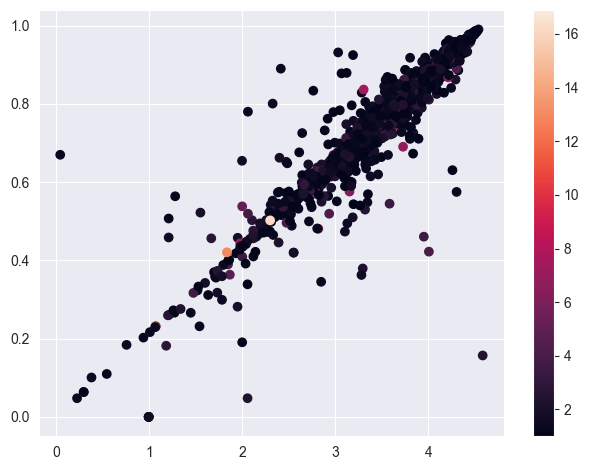

In [19]:
plt.scatter(result4[result4['mase'] > 1]["stat_entropy1"], result4[result4['mase'] > 1]["perm_ent4"], c=result4[result4['mase'] > 1]['mase'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

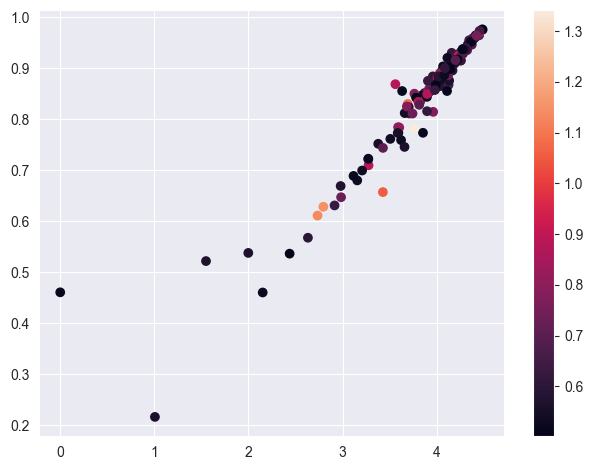

In [21]:
plt.scatter(result4[result4['smape'] > 0.5]["stat_entropy1"], result4[result4['smape'] > 0.5]["perm_ent4"], c=result4[result4['smape'] > 0.5]['smape'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

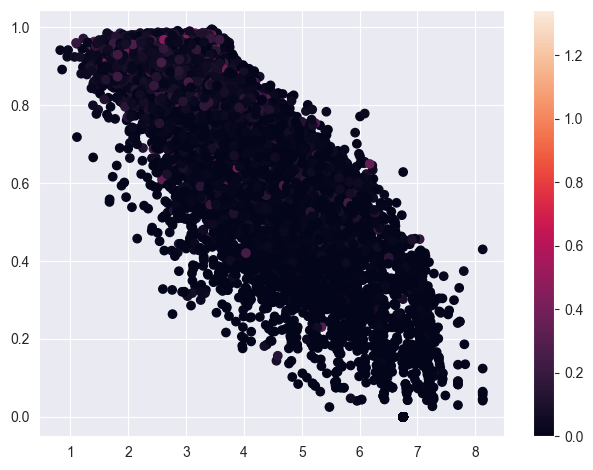

In [31]:
plt.scatter(result4["tran_entropy2"], result4["perm_ent4"], c=result4['smape'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

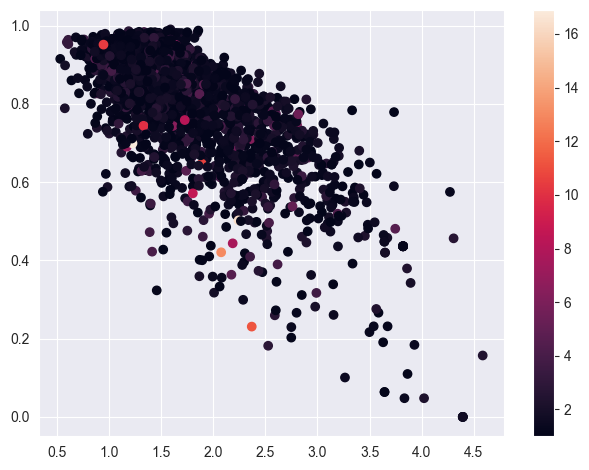

In [38]:
plt.scatter(result4[result4['mase'] > 1]["tran_entropy1"], result4[result4['mase'] > 1]["perm_ent4"], c=result4[result4['mase'] > 1]['mase'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

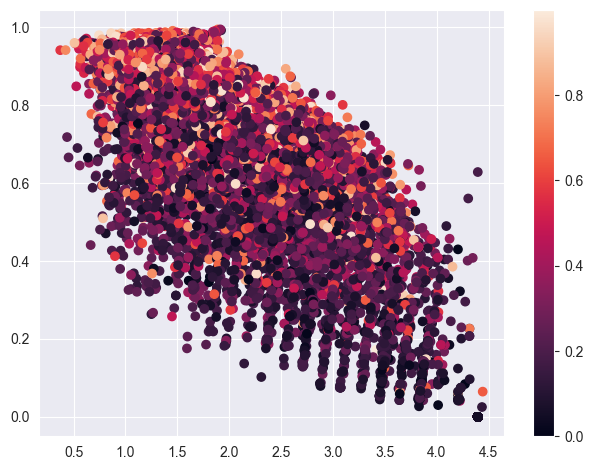

In [39]:
plt.scatter(result4[result4['mase'] < 1]["tran_entropy1"], result4[result4['mase'] < 1]["perm_ent4"], c=result4[result4['mase'] < 1]['mase'], alpha=1)
plt.colorbar()
plt.tight_layout()
plt.show()

In [42]:
correlation = result4.corr()['mase'].abs().sort_values(ascending=False)

print(correlation.head(20))

mase             1.000000
smape            0.525981
mape             0.342990
mse              0.284694
stat_entropy1    0.243361
stat_entropy2    0.242267
stat_entropy3    0.241503
stat_entropy4    0.241053
stat_entropy5    0.241007
perm_ent4        0.239849
tran_entropy5    0.211457
tran_entropy4    0.210161
tran_entropy3    0.206416
tran_entropy2    0.203723
frob_norm5       0.201146
frob_norm4       0.185978
tran_entropy1    0.183005
nuclear_norm1    0.178589
frob_norm3       0.144103
sym_test1        0.129770
Name: mase, dtype: float64


In [43]:
correlation = result4.corr()['smape'].abs().sort_values(ascending=False)

print(correlation.head(20))

smape            1.000000
mape             0.747666
mase             0.525981
max_diff         0.418346
mse              0.302923
perm_ent4        0.293070
stat_entropy1    0.292550
sym_test         0.290389
stat_entropy2    0.287909
stat_entropy3    0.286376
stat_entropy5    0.285651
stat_entropy4    0.285539
sym_test1        0.284092
tran_entropy3    0.282417
tran_entropy4    0.280602
sym_pv           0.277242
tran_entropy5    0.274370
amplitude        0.270309
frob_norm5       0.270309
tran_entropy2    0.254260
Name: smape, dtype: float64
